Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.
Generated Tracks: {0: <__main__.Track object at 0x7f25701ba670>, 1: <__main__.Track object at 0x7f2569935730>, 2: <__main__.Track object at 0x7f256939dd30>, 3: <__main__.Track object at 0x7f256939de20>, 4: <__main__.Track object at 0x7f25690ed250>, 5: <__main__.Track object at 0x7f25690ed310>, 6: <__main__.Track object at 0x7f25690ed4c0>, 7: <__main__.Track object at 0x7f25690ed580>, 8: <__main__.Track object at 0x7f25690ed6a0>, 9: <__main__.Track object at 0x7f25690ed7c0>, 10: <__main__.Track object at 0x7f25690ed880>, 11: <__main__.Track object at 0x7f25690ed940>, 12: <__main__.Track object at 0x7f25690eda00>, 13: <__main__.Track object at 0x7f25690edaf0>, 14: <__main__.Track object at 0x7f25690edc10>, 15: <__main__.Track object at 0x7f25690edd60>, 16: <__main__.Track object at 0x7f25690ede50>, 17: <__main__.Track obj

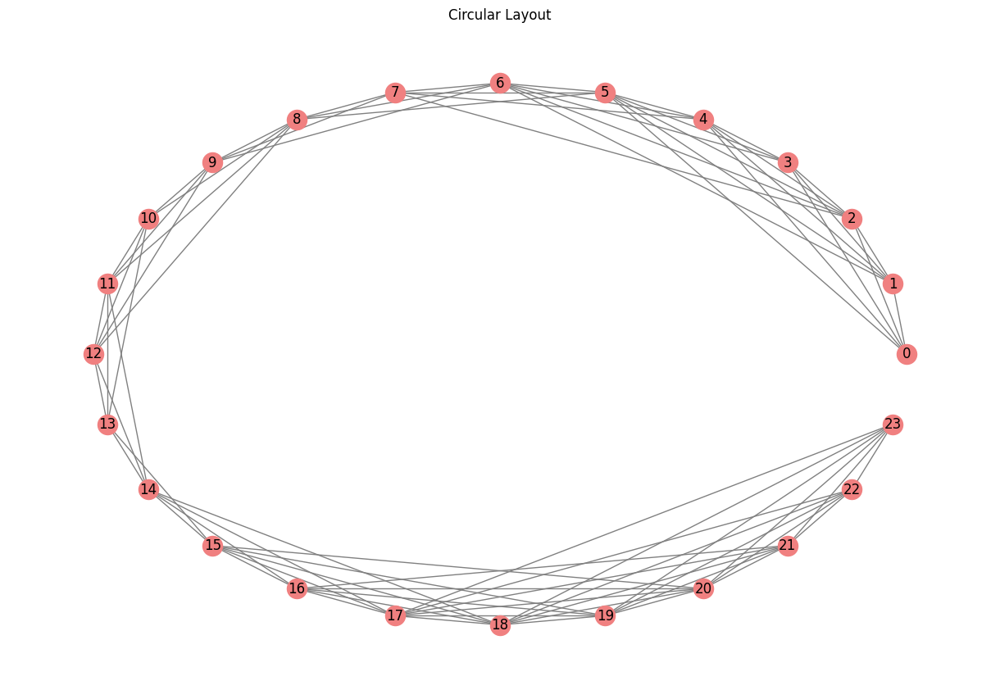

Total number of tracks: 8620

Track 0:
 - Observed by camera 0 at position (1072.2626953125, 1368.9322509765625)
 - Observed by camera 1 at position (1072.6990966796875, 1367.8670654296875)
 - Observed by camera 2 at position (1071.1817626953125, 1386.30908203125)
 - Observed by camera 3 at position (1072.1021728515625, 1447.1929931640625)
 - Observed by camera 5 at position (1068.776611328125, 167.46632385253906)
 - Observed by camera 4 at position (1074.7354736328125, 1481.8641357421875)

Track 1:
 - Observed by camera 0 at position (19.103351593017578, 1441.6048583984375)
 - Observed by camera 1 at position (17.848295211791992, 1440.767578125)
 - Observed by camera 2 at position (21.959007263183594, 1444.718017578125)

Track 2:
 - Observed by camera 0 at position (486.0768127441406, 398.71246337890625)
 - Observed by camera 1 at position (485.143798828125, 398.32122802734375)
 - Observed by camera 2 at position (493.6943664550781, 397.4660339355469)
 - Observed by camera 3 at positi

Initial error: 656737, values: 2551
iter      cost      cost_change    lambda  success iter_time
   0  7.376477e+05   -8.09e+04    1.00e-05     1    5.24e-02
iter      cost      cost_change    lambda  success iter_time
   0  7.216053e+05   -6.49e+04    1.00e-04     1    4.87e-02
iter      cost      cost_change    lambda  success iter_time
   0  6.832586e+05   -2.65e+04    1.00e-03     1    4.66e-02
iter      cost      cost_change    lambda  success iter_time
   0  4.978867e+05    1.59e+05    1.00e-02     1    4.69e-02
   1  5.853738e+05   -8.75e+04    1.00e-03     1    4.52e-02
   1  4.290214e+05    6.89e+04    1.00e-02     1    7.10e-02
   2  4.165815e+05    1.24e+04    1.00e-03     1    8.39e-02
   3  5.034796e+05   -8.69e+04    1.00e-04     1    6.74e-02
   3  1.192725e+06   -7.76e+05    1.00e-03     1    7.69e-02
   3  3.497673e+05    6.68e+04    1.00e-02     1    8.76e-02
   4  5.575432e+05   -2.08e+05    1.00e-03     1    8.93e-02
   4  6.489870e+05   -2.99e+05    1.00e-02     1 

In [1]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
import gtsam
import open3d as o3d
import networkx as nx
from itertools import combinations
from gtsam import symbol

# UnionFind is used to generate Tracks acorss multiple images.
# A good explanation of it: https://github.com/openMVG/openMVG/issues/1630
class UnionFind:
    def __init__(self):
        self.parent = {}
        self.rank = {}

    def find(self, x):
        if self.parent[x] != x:
            self.parent[x] = self.find(self.parent[x])
        return self.parent[x]

    def union(self, x, y):
        rootX = self.find(x)
        rootY = self.find(y)
        if rootX != rootY:
            if self.rank[rootX] > self.rank[rootY]:
                self.parent[rootY] = rootX
            elif self.rank[rootX] < self.rank[rootY]:
                self.parent[rootX] = rootY
            else:
                self.parent[rootY] = rootX
                self.rank[rootX] += 1

    def add(self, x):
        if x not in self.parent:
            self.parent[x] = x
            self.rank[x] = 1

    def get_clusters(self):
        clusters = {}
        for x in self.parent:
            root = self.find(x)
            if root not in clusters:
                clusters[root] = []
            clusters[root].append(x)
        return clusters.values()

class Feature:
    def __init__(self, x_obs, y_obs, cam_id, tr_id, kp, w=1.0):
        self.x = x_obs
        self.y = y_obs
        self.camera_id = cam_id
        self.track_id = tr_id
        self.weight = w
        self.kp = kp

# Track is the observation across multiple images(can be just seen as a 3D point), it can be observed by multiple images.
# Track class mainly includes the 3D point, and the observation of it (features) in different images.
class Track:
    def __init__(self, track_id):
        self._track_id = track_id
        self._features = {}  # map between camera_id <-> feature
        self._position_world = np.zeros(3)  
        self._triangulated = False

    def id(self):
        return self._track_id

    def get_position(self):
        return self._position_world

    def set_position(self, position):
        self._position_world = position

    def get_homogeneous_position(self):
        return np.append(self._position_world, 1)  

    def get_camera_ids(self):
        return set(self._features.keys())

    def add_feature(self, feature):
        self._features[feature.camera_id] = feature

    def remove_feature(self, camera_id):
        if camera_id in self._features:
            del self._features[camera_id]

    def num_features(self):
        return len(self._features)

class ImageMatch:
    def __init__(self, kp, other_image_id, other_image_kp):
        self.kp = kp  # current keypoint id
        self.other_image_id = other_image_id
        self.other_image_kp = other_image_kp

# Actually, camera is just image in this case. 
# In SFM, the images do not need to be generated by the same camera.
# So more generally, we usually call it camera.
class Camera:
    def __init__(self, camera_id):
        self._camera_id = camera_id
        # In this case, intrinsics all the same for all cameras.
        # I used the "groundtruth" intrinsic, generate by COLMAP.
        # Actually, GTSAM also provide factor to conduct BA, and also estimating the intrinsic:
        # https://gtsam.org/doxygen/4.0.0/a03995.html
        self._intrinsics = np.array([[1662, 0, 540],
                                     [0, 1673, 960],
                                     [0, 0, 1]], dtype=np.float32)
        self._features = {}  # map between track_id <-> feature
        self._R_camera_world = None
        self._t_camera_world = None
        self.matches_with = {}  
        self._kp = []
        self._desc = []
        self.img_matches = {}

    def id(self):
        return self._camera_id

    def set_pose(self, Rcw, tcw):
        self._R_camera_world = Rcw  
        self._t_camera_world = tcw  

    def get_pose(self):
        return gtsam.Pose3(gtsam.Rot3(self._R_camera_world), np.reshape(self._t_camera_world, (3, 1)))

    def get_rotation(self):
        return self._R_camera_world

    def get_orientation(self):
        return np.linalg.inv(self._R_camera_world)

    def get_translation(self):
        return self._t_camera_world

    def get_camera_center(self):
        return -self._R_camera_world.T @ self._t_camera_world

    def get_transformation_matrix(self):
        extrinsics = np.hstack((self._R_camera_world, self._t_camera_world.reshape(-1, 1)))
        return extrinsics

    def get_projection_matrix(self):
        extrinsics = self.get_transformation_matrix()
        return self._intrinsics @ extrinsics

    def get_track_ids(self):
        return set(self._features.keys())

    def add_feature(self, feature):
        self._features[feature.track_id] = feature

    def remove_feature(self, track_id):
        if track_id in self._features:
            del self._features[track_id]

    def get_feature_const(self, track_id):
        return self._features.get(track_id, None)

    def num_features(self):
        return len(self._features)

    def add_match(self, match_info):
        self.matches_with[match_info.other_image_id] = match_info

    def get_img_matches(self, key):
        return self.img_matches.get(key, None)

    def get_track_id_by_kp(self, kp):
        """Retrieve track_id based on the given keypoint (kp)."""
        for track_id, feature in self._features.items():
            if feature.kp == kp:
                return feature.track_id
        return None


def construct_graph(camera_nodes, tracks):
    graph = gtsam.NonlinearFactorGraph()
    initials = gtsam.Values()

    # Prior noise models
    pose_noise = gtsam.noiseModel.Diagonal.Sigmas(np.concatenate([np.full(3, 0.1), np.full(3, 0.1)]))
    point_noise = gtsam.noiseModel.Isotropic.Sigma(3, 0.1)
    initial_cam = True
    initial_point = True
    # Add initial values for cameras and a prior factor for the first camera
    for camera_id in camera_nodes:
        camera = camera_nodes[camera_id]
        assert camera is not None, f"Camera {camera_id} does not exist!"
        assert camera_id == camera.id(), f"Camera ID mismatch for camera {camera_id}"

        initials.insert(symbol('x', camera_id), camera.get_pose())

        if initial_cam == True:
            graph.add(gtsam.PriorFactorPose3(symbol('x', camera_id), camera.get_pose(), pose_noise))
            initial_cam = False
    # Add initial values for tracks and an optional prior for the first track
    for track_id in tracks:
        track = tracks[track_id]
        if track._triangulated == True:
            assert track is not None, f"Track {track_id} does not exist!"
            assert track_id == track.id(), f"Track ID mismatch for track {track_id}"

            initials.insert(symbol('l', track_id), track.get_position())

            if initial_point == True:
                graph.add(gtsam.PriorFactorPoint3(symbol('l', track_id), track.get_position(), point_noise))
                initial_point = False
    # Measurement noise
    base_measurement_noise = gtsam.noiseModel.Isotropic.Sigma(2, 10.0)
    measurement_noise = gtsam.noiseModel.Robust.Create(
        gtsam.noiseModel.mEstimator.Huber(1.345), base_measurement_noise)

    # Add projection factors for each feature observation
    for camera_id in camera_nodes:
        camera = camera_nodes[camera_id]
        intrinsics = camera._intrinsics
        calibration = gtsam.Cal3_S2(
            intrinsics[0, 0], intrinsics[1, 1], 0, intrinsics[0, 2], intrinsics[1, 2]
        )

        for track_id in camera.get_track_ids():
            if track_id not in tracks:
                continue
            if tracks[track_id]._triangulated == True:

                feature = camera.get_feature_const(track_id)
                assert feature.camera_id == camera_id, "Feature camera_id mismatch"
                assert feature.track_id == track_id, "Feature track_id mismatch"

                measurement = gtsam.Point2(feature.x, feature.y)
                graph.add(
                    gtsam.GenericProjectionFactorCal3_S2(
                        measurement, measurement_noise,
                        symbol('x', camera_id), symbol('l', track_id), calibration
                    )
                )

    return graph, initials

def optimize_graph(graph, initials):
    parameters = gtsam.LevenbergMarquardtParams()
    parameters.setVerbosityLM("SUMMARY")  
    parameters.setMaxIterations(10)      
    parameters.setRelativeErrorTol(1e-5)  
    parameters.setAbsoluteErrorTol(1e-5)  

    optimizer = gtsam.LevenbergMarquardtOptimizer(graph, initials, parameters)
    result = optimizer.optimize()
    obj_after = graph.error(result)

    return result, obj_after

def update_camera_nodes_and_tracks(values, camera_nodes, tracks):
    for key in values.keys():
        # Get the symbol's character and ID
        symbol_char = chr(gtsam.symbolChr(key))
        symbol_id = gtsam.symbolIndex(key)

        # Check if it is a camera pose or a 3D point
        if symbol_char == 'x':
            # Camera pose
            if symbol_id in camera_nodes:
                pose = values.atPose3(key)
                camera_nodes[symbol_id].set_pose(pose.rotation().matrix(), pose.translation())
            else:
                print(f"Warning: Camera ID {symbol_id} not found in camera_nodes")

        elif symbol_char == 'l':
            # 3D point for track
            if symbol_id in tracks:
                point3 = values.atPoint3(key)
                point3_array = np.array(point3).flatten()
                if point3_array[2] > 0:
                    tracks[symbol_id].set_position(point3_array)
                # tracks[symbol_id].set_position(np.array([point3.x(), point3.y(), point3.z()]))
            else:
                print(f"Warning: Track ID {symbol_id} not found in tracks")

# For visualization
def create_camera_frustum(scale=0.2):
    camera_vertices = np.array([
        [-0.5, -0.5, 0],  # Left-bottom-near
        [0.5, -0.5, 0],  # Right-bottom-near
        [0.5, 0.5, 0],  # Right-top-near
        [-0.5, 0.5, 0],  # Left-top-near
        [-2, -2, 2],  # Left-bottom-far
        [2, -2, 2],  # Right-bottom-far
        [2, 2, 2],  # Right-top-far
        [-2, 2, 2]  # Left-top-far
    ]) * scale

    camera_lines = [
        [0, 1], [1, 2], [2, 3], [3, 0],  # Front
        [4, 5], [5, 6], [6, 7], [7, 4],  # Back
        [0, 4], [1, 5], [2, 6], [3, 7]  # Connection
    ]

    colors = [[1, 0, 0] for _ in range(len(camera_lines))]

    camera_frustum = o3d.geometry.LineSet()
    camera_frustum.points = o3d.utility.Vector3dVector(camera_vertices)
    camera_frustum.lines = o3d.utility.Vector2iVector(camera_lines)
    camera_frustum.colors = o3d.utility.Vector3dVector(colors)

    return camera_frustum

# For visualization
def create_transformation_matrix(translation, rotation):
    transformation = np.eye(4)
    transformation[:3, :3] = rotation
    transformation[:3, 3] = translation.reshape(-1)
    return transformation

# For visualization
def create_point_cloud(track_dict):
    points = [track.get_position() for track in track_dict.values() if track._triangulated]
    point_cloud = o3d.geometry.PointCloud()
    point_cloud.points = o3d.utility.Vector3dVector(points)
    point_cloud.paint_uniform_color([0, 1, 0])
    return point_cloud

# For visualization
def visualize_multiple_cameras_and_points(camera_dict, track_dict):
    geometries = []

    for camera_id, camera in camera_dict.items():
        rotation = camera.get_rotation()
        translation = camera.get_translation()

        camera_frustum = create_camera_frustum(scale=0.2)

        transformation = create_transformation_matrix(translation, rotation)

        camera_frustum.transform(transformation)

        geometries.append(camera_frustum)

    # Only include points from tracks where _triangulated is True
    point_cloud = create_point_cloud(track_dict)
    geometries.append(point_cloud)

    o3d.visualization.draw_plotly(geometries,
                                  zoom=0.2,
                                  front=[0.0, 0.0, -1.0],
                                  lookat=[0, 0, 0],
                                  up=[0.0, 1.0, 0.0])


def normalize_image(image):
    return cv2.normalize(image.astype('float32'), None, 0.0, 1.0, cv2.NORM_MINMAX)

def load_images_from_folder(folder):
    images = []
    for filename in sorted(os.listdir(folder)):
        img_path = os.path.join(folder, filename)
        img = cv2.imread(img_path)
        if img is not None:
            img_normalized = normalize_image(img)
            images.append(img_normalized)
    return images

def extract_keypoints_and_descriptors(img):
    sift = cv2.SIFT_create(nfeatures=4000, nOctaveLayers=12, contrastThreshold=0.025, sigma=1.5)

    img_uint8 = (img * 255).astype('uint8')

    keypoints, descriptors = sift.detectAndCompute(img_uint8, None)

    return keypoints, descriptors

def find_matches(img1, img2, keypoints1, descriptors1, keypoints2, descriptors2):
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    raw_matches = bf.knnMatch(descriptors1, descriptors2, k=2)

    good_matches = []
    for m, n in raw_matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)

    img1_uint8 = (img1 * 255).astype('uint8') if img1.dtype != 'uint8' else img1
    img2_uint8 = (img2 * 255).astype('uint8') if img2.dtype != 'uint8' else img2

    return good_matches

def process_images(folder):
    images = load_images_from_folder(folder)
    G = nx.Graph()
    tracks = {}
    camera_nodes = []
    keypoints_list = []
    descriptors_list = []
    uf = UnionFind()
    track_id_counter = 0

    # Load images and initialize camera nodes
    for idx, img in enumerate(images):
        keypoints, descriptors = extract_keypoints_and_descriptors(img)
        camera_node = Camera(idx)
        camera_node._kp = keypoints
        camera_node._desc = descriptors
        camera_nodes.append(camera_node)
        keypoints_list.append(keypoints)
        descriptors_list.append(descriptors)

    # Find matches between pairs of images
    for i in range(len(images)):
        for j in range(i + 1, len(images)):
            node1 = camera_nodes[i]
            node2 = camera_nodes[j]
            matches = find_matches(images[i], images[j], keypoints_list[i], descriptors_list[i], keypoints_list[j],
                                   descriptors_list[j])

            if len(matches) > 200:
                img_matches_i_to_j = []
                img_matches_j_to_i = []

                for match in matches:
                    kp_idx_i = match.queryIdx
                    kp_idx_j = match.trainIdx

                    img_match_i_to_j = ImageMatch(kp_idx_i, j, kp_idx_j)
                    img_match_j_to_i = ImageMatch(kp_idx_j, i, kp_idx_i)

                    img_matches_i_to_j.append(img_match_i_to_j)
                    img_matches_j_to_i.append(img_match_j_to_i)

                node1.img_matches[j] = img_matches_i_to_j
                node2.img_matches[i] = img_matches_j_to_i

                G.add_node(node1._camera_id, camera=node1)
                G.add_node(node2._camera_id, camera=node2)
                G.add_edge(node1._camera_id, node2._camera_id, weight=len(matches))

    # Build tracks from matched features using Union-Find
    for cam in camera_nodes:
        cam_id = cam._camera_id
        for other_cam_id, img_matches in cam.img_matches.items():
            for img_match in img_matches:
                kp_id = (cam_id, img_match.kp)
                other_kp_id = (img_match.other_image_id, img_match.other_image_kp)

                # Add to union-find structure
                uf.add(kp_id)
                uf.add(other_kp_id)
                uf.union(kp_id, other_kp_id)

    # Convert Union-Find clusters to Track objects
    for cluster in uf.get_clusters():
        track = Track(track_id_counter)
        for (cam_id, kp_id) in cluster:
            cam = camera_nodes[cam_id]
            kp = cam._kp[kp_id].pt  # Keypoint coordinates (x, y)
            feature = Feature(x_obs=kp[0], y_obs=kp[1], cam_id=cam_id, tr_id=track_id_counter, kp=kp_id)
            track.add_feature(feature)
            cam.add_feature(feature)
        tracks[track_id_counter] = track
        track_id_counter += 1

    print("Generated Tracks:", tracks)

    plt.figure(figsize=(12, 8))
    pos = nx.circular_layout(G)
    nx.draw(G, pos, with_labels=True, node_color="lightcoral", edge_color="gray")
    plt.title("Circular Layout")
    plt.show()

    print(f"Total number of tracks: {len(tracks)}")
    for track_id, track in tracks.items():
        print(f"\nTrack {track_id}:")
        for cam_id, feature in track._features.items():
            print(f" - Observed by camera {cam_id} at position ({feature.x}, {feature.y})")

    print("Nodes in graph:", G.nodes)
    print("Edges in graph with weights (match counts):")
    for edge in G.edges(data=True):
        print(edge)

    return camera_nodes, tracks, G

# A 3d point should be observed at least 3 times, can be a stable 3D point
def filter_tracks_by_observation(tracks, camera_nodes):
    tracks_to_remove = []

    for track_id, track in list(tracks.items()):
        if track.num_features() < 3:
            tracks_to_remove.append(track_id)

            for cam in camera_nodes:
                cam.remove_feature(track_id)
    for track_id in tracks_to_remove:
        del tracks[track_id]

    return tracks, camera_nodes

# Use cam_7 and cam_8 to initialize.
# Actually, initialization can be done by some trick on picking the "best" edge in the graph.
# But just to simplify the process， manually selected two images with relatively large disparity.
# On how to initialize a SMF system, OpenMVG provided good example.
def initialization(G, camera_nodes, tracks):
    cameras_processed_id = []
    cameras_processed = {}
    cam_7 = camera_nodes[7]
    cam_8 = camera_nodes[8]

    # Get matches between cam_7 and cam_8
    matches = cam_7.get_img_matches(8)

    # Ensure matches is not None or empty
    if not matches:
        raise ValueError("No matches found between cam_7 and cam_8")

    filtered_matches = [
        m for m in matches
        if m.kp is not None and m.other_image_kp is not None and
           (track_id_7 := cam_7.get_track_id_by_kp(m.kp)) is not None and
           (track_id_8 := cam_8.get_track_id_by_kp(m.other_image_kp)) is not None and
           track_id_7 in tracks and track_id_8 in tracks
    ]
    points1 = np.array([
        cam_7._kp[m.kp].pt for m in filtered_matches
        if m.kp is not None and
           (track_id := cam_7.get_track_id_by_kp(m.kp)) is not None and
           track_id in tracks
    ], dtype=np.float32)

    points1_track_id = np.array([
        track_id for m in filtered_matches
        if m.kp is not None and
           (track_id := cam_7.get_track_id_by_kp(m.kp)) is not None and
           track_id in tracks
    ], dtype=np.int32)

    points2 = np.array([
        cam_8._kp[m.other_image_kp].pt for m in filtered_matches
        if m.other_image_kp is not None and
           (track_id := cam_8.get_track_id_by_kp(m.other_image_kp)) is not None and
           track_id in tracks
    ], dtype=np.float32)

    points2_track_id = np.array([
        track_id for m in filtered_matches
        if m.other_image_kp is not None and
           (track_id := cam_8.get_track_id_by_kp(m.other_image_kp)) is not None and
           track_id in tracks
    ], dtype=np.int32)

    assert np.array_equal(points1_track_id, points2_track_id), "points1_track_id and points2_track_id are not equal"

    inital_pose = np.eye(4)
    cam_7.set_pose(inital_pose[:3, :3], inital_pose[:3, 3])
    F, mask = cv2.findFundamentalMat(points1, points2, cv2.FM_RANSAC, ransacReprojThreshold=1.0, confidence=0.999, maxIters=2000)
    E = cam_7._intrinsics.T @ F @ cam_7._intrinsics
    retval, R, t, mask_pose = cv2.recoverPose(E, points1, points2, cam_7._intrinsics)

    cam_8.set_pose(R, t)
    P1 = np.dot(cam_7._intrinsics, np.hstack((np.eye(3), np.zeros((3, 1)))))
    P2 = np.dot(cam_8._intrinsics, np.hstack((R, t)))

    points_4d_homogeneous = cv2.triangulatePoints(P1, P2, points1.T, points2.T)
    points_3d = points_4d_homogeneous[:3] / points_4d_homogeneous[3]  

    valid_points_3d = points_3d[:, mask.ravel() == 1]
    # the tracks was after filtering, so the tracks we using here are all ""
    valid_track_ids = points2_track_id[mask.ravel() == 1]
    for i, point in enumerate(valid_points_3d.T):
        track_id = valid_track_ids[i]
        tr = tracks[track_id]
        tr.set_position(point)
        tr._triangulated = True

    G.remove_edge(7, 8)
    cameras_initial = dict({7: cam_7, 8: cam_8})
    visualize_multiple_cameras_and_points(cameras_initial, tracks)
    cameras_processed_id.append(7)
    cameras_processed_id.append(8)
    cameras_processed[7] = cam_7
    cameras_processed[8] = cam_8

    return cameras_processed_id, cameras_processed

def count_triangulated_tracks(points1_track_id, tracks):
    triangulated_count = 0

    for track_id in points1_track_id:
        if track_id in tracks and tracks[track_id]._triangulated:
            triangulated_count += 1

    return triangulated_count

# Pick the "best" new camera to add in the multi-view system
# The idea is to choose the edge with the most tracks that have been triangulated， as the next new added image. 
def find_best_edge_for_triangulation(graph, tracks, node_list):
    max_triangulated_count = 0
    best_edge = None

    node_set = set(node_list)

    for node_id in node_list:
        for neighbor_id in graph.neighbors(node_id):
            if neighbor_id not in node_set:
                node1 = graph.nodes[node_id]['camera']
                node2 = graph.nodes[neighbor_id]['camera']

                matches = node1.get_img_matches(neighbor_id)

                points1_track_id = np.array(
                    [node1.get_track_id_by_kp(m.kp) if node1.get_track_id_by_kp(m.kp) is not None else -1 for m in matches],
                    dtype=np.int32
                )

                triangulated_count = count_triangulated_tracks(points1_track_id, tracks)

                if triangulated_count > max_triangulated_count:
                    max_triangulated_count = triangulated_count
                    best_edge = (node_id, neighbor_id)

    return best_edge, max_triangulated_count

def get_tracks_positions(tracks, pnp_track_id):
    positions = []

    for track_id in pnp_track_id:
        if track_id in tracks:
            track = tracks[track_id]
            positions.append(track.get_position())

    return np.array(positions, dtype=np.float32)

def get_observations(camera, pnp_track_id):
    observations = []

    for track_id in pnp_track_id:
        feature = camera.get_feature_const(track_id)
        if feature is not None:
            observations.append([feature.x, feature.y])

    return np.array(observations, dtype=np.float32)

def get_feature_points(camera, track_id_list):
    points1 = []

    for track_id in track_id_list:
        feature = camera.get_feature_const(track_id)
        if feature is not None:
            points1.append([feature.x, feature.y])

    if points1:
        points1 = np.array(points1, dtype=np.float32)
    else:
        points1 = np.empty((0, 2), dtype=np.float32)

    return points1

# For the new add image, use PnP(give the triangulated 3D point, and 2d features measurement), 
# to recover the transformation between the new add image, and one existing image in the current multi-view system
def register_new_images(G, new_camera_id_1, new_camera_id_2, cameras, tracks, cameras_processed_id, cameras_processed):
    if new_camera_id_1 not in cameras_processed_id:
        new_camera_id = new_camera_id_1
        other_camera_id = new_camera_id_2
    else:
        new_camera_id = new_camera_id_2
        other_camera_id = new_camera_id_1
    new_camera = cameras[new_camera_id]
    other_camera = cameras[other_camera_id]
    # 1， Get pose of new camera, using PnP
    matches = new_camera.get_img_matches(other_camera_id)
    filtered_matches = [
        m for m in matches
        if m.kp is not None and m.other_image_kp is not None and
           (track_id_new := new_camera.get_track_id_by_kp(m.kp)) is not None and
           (track_id_other := other_camera.get_track_id_by_kp(m.other_image_kp)) is not None and
           track_id_new in tracks and track_id_other in tracks
    ]

    # Get all the tracks belong to this edge
    points1_track_id = np.array(
        [new_camera.get_track_id_by_kp(m.kp) for m in filtered_matches if new_camera.get_track_id_by_kp(m.kp) is not None],
        dtype=np.int32
    )

    # Get the track_id of triangulated tracks
    pnp_track_id = []
    for track_id in points1_track_id:
        if track_id in tracks and tracks[track_id]._triangulated:
            pnp_track_id.append(track_id)
    # Get 3d point of pnp_track_id
    object_points = get_tracks_positions(tracks, pnp_track_id)
    # Get feature of pnp_track_id in new_camera
    image_points = get_observations(new_camera, pnp_track_id)
    dist_coeffs = np.zeros((4, 1))

    success, rotation_vector, t, inliers = cv2.solvePnPRansac(
        object_points, image_points, new_camera._intrinsics, dist_coeffs, reprojectionError=8.0, confidence=0.99,
        flags=cv2.SOLVEPNP_ITERATIVE
    )
    if success:
        R, _ = cv2.Rodrigues(rotation_vector)
        new_camera.set_pose(R, t)

    # Triangulation new points
    points1_track_id_list = points1_track_id.tolist()
    # remaining_track_ids = np.setdiff1d(points1_track_id_list, pnp_track_id)
    remaining_track_ids = list(set(points1_track_id_list) - set(pnp_track_id))

    # Triangulate track of remaining_track_ids
    P1 = np.dot(other_camera._intrinsics,
                np.hstack((other_camera.get_rotation(), other_camera.get_translation().reshape(-1, 1))))

    P2 = np.dot(new_camera._intrinsics, np.hstack((R, t)))

    points1 = get_feature_points(other_camera, remaining_track_ids)
    points2 = get_feature_points(new_camera, remaining_track_ids)
    F, mask = cv2.findFundamentalMat(points1, points2, cv2.FM_RANSAC, ransacReprojThreshold=1.0, confidence=0.999, maxIters=2000)

    points_4d_homogeneous = cv2.triangulatePoints(P1, P2, points1.T, points2.T)
    points_3d = points_4d_homogeneous[:3] / points_4d_homogeneous[3] 
    depth_positive_indices = points_3d[2] > 0  # Check for Z > 0
    mask_indices = mask.ravel() == 1
    valid_points_3d = points_3d[:, depth_positive_indices & mask_indices]

    remaining_track_ids = np.array(remaining_track_ids)
    flat_mask = np.squeeze(mask).astype(bool)
    intersection_mask = depth_positive_indices & flat_mask

    if len(remaining_track_ids) == len(intersection_mask):
        valid_track_ids = remaining_track_ids[intersection_mask]
    else:
        print("Lengths do not match. Check the dimensions.")

    for i, point in enumerate(valid_points_3d.T):
        track_id = valid_track_ids[i]
        tr = tracks[track_id]
        tr.set_position(point)
        tr._triangulated = True

    cameras_processed_id.append(new_camera_id)
    cameras_processed[new_camera_id] = new_camera
    for node_i, node_j in combinations(cameras_processed_id, 2):
        if graph.has_edge(node_i, node_j):
            graph.remove_edge(node_i, node_j)
    cameras_initial = cameras_processed
    visualize_multiple_cameras_and_points(cameras_initial, tracks)

def process_graph(G, filtered_tracks, cameras_processed_id, cameras, cameras_processed):
    while G.edges:
        # Find the edge with the maximum weight
        best_edge, max_triangulated_count = find_best_edge_for_triangulation(graph, filtered_tracks, cameras_processed_id)

        node1_id = best_edge[0]
        node2_id = best_edge[1]
        register_new_images(G, node1_id, node2_id, cameras, filtered_tracks, cameras_processed_id, cameras_processed)

        camera1 = G.nodes[node1_id]['camera']
        camera2 = G.nodes[node2_id]['camera']

    gtsam_graph, initials = construct_graph(cameras_processed, filtered_tracks)
    obj_before =  gtsam_graph.error(initials)
    result, obj_after = optimize_graph(gtsam_graph, initials)
    update_camera_nodes_and_tracks(result, cameras_processed, filtered_tracks)
    visualize_multiple_cameras_and_points(cameras_processed, filtered_tracks)

folder_path = 'data/Buddha'
camera_nodes, tracks, graph = process_images(folder_path)
filtered_tracks, filtered_camera_nodes = filter_tracks_by_observation(tracks, camera_nodes)
cameras_processed_id, cameras_processed = initialization(graph, filtered_camera_nodes, filtered_tracks)
process_graph(graph, filtered_tracks, cameras_processed_id, filtered_camera_nodes, cameras_processed)

